<a href="https://colab.research.google.com/github/GVGunasekhar/DATA_ANALYSIS_EV_CAR/blob/main/DATA_ANALYSIS_EV_PROJECT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**DATA ANALYSIS ON ELECTRIC VEHICLE**


**DATA PREPROCESSING**

In [56]:
# Data manipulation and analysis
import pandas as pd
import numpy as np

# Data visualization (seaborn and matplotlib)
import seaborn as sns
import matplotlib.pyplot as plt

# Plotly for interactive visualizations (Choropleth and Racing Bar Plot)
import plotly.express as px
import plotly.graph_objects as go

# Optional: Display interactive visualizations in Jupyter Notebook
from plotly.subplots import make_subplots
from IPython.display import display

# Ensure the plots are displayed inline
%matplotlib inline

# Optional: Warnings can be ignored
import warnings
warnings.filterwarnings("ignore")

In [57]:
# Load dataset using pandas
data = pd.read_csv('/content/Dataset.csv')

# Display the first few rows of the dataset to verify it loaded correctly
data.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [58]:
# Display the last few rows of the dataset
data.tail()


,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
112629,7SAYGDEF2N,King,Duvall,WA,98019,2022,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,45.0,217955265,POINT (-121.98609 47.74068),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032401
112630,1N4BZ1CP7K,San Juan,Friday Harbor,WA,98250,2019,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,150,0,40.0,103663227,POINT (-123.01648 48.53448),BONNEVILLE POWER ADMINISTRATION||ORCAS POWER &...,53055960301
112631,1FMCU0KZ4N,King,Vashon,WA,98070,2022,FORD,ESCAPE,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,34.0,193878387,POINT (-122.4573 47.44929),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033027702
112632,KNDCD3LD4J,King,Covington,WA,98042,2018,KIA,NIRO,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,47.0,125039043,POINT (-122.09124 47.33778),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032007
112633,YV4BR0CL8N,King,Covington,WA,98042,2022,VOLVO,XC90,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,18,0,47.0,194673692,POINT (-122.09124 47.33778),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032005


In [59]:
# Display the shape of the dataset (rows, columns)
data.shape


(112634, 17)

In [60]:
# Display information about the DataFrame
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         112634 non-null  object 
 1   County                                             112634 non-null  object 
 2   City                                               112634 non-null  object 
 3   State                                              112634 non-null  object 
 4   Postal Code                                        112634 non-null  int64  
 5   Model Year                                         112634 non-null  int64  
 6   Make                                               112634 non-null  object 
 7   Model                                              112614 non-null  object 
 8   Electric Vehicle Type                              112634 non-null  object

In [61]:
# Display statistical summary of the dataset
data.describe()


,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
count,112634.000000,112634.000000,112634.000000,112634.000000,112348.000000,1.126340e+05,1.126340e+05
mean,98156.226850,2019.003365,87.812987,1793.439681,29.805604,1.994567e+08,5.296650e+10
std,2648.733064,2.892364,102.334216,10783.753486,14.700545,9.398427e+07,1.699104e+09
min,1730.000000,1997.000000,0.000000,0.000000,1.000000,4.777000e+03,1.101001e+09
25%,98052.000000,2017.000000,0.000000,0.000000,18.000000,1.484142e+08,5.303301e+10
50%,98119.000000,2020.000000,32.000000,0.000000,34.000000,1.923896e+08,5.303303e+10
75%,98370.000000,2022.000000,208.000000,0.000000,43.000000,2.191899e+08,5.305307e+10
max,99701.000000,2023.000000,337.000000,845000.000000,49.000000,4.792548e+08,5.603300e+10


In [62]:
# Check for missing values
data.isnull().sum()

,0
VIN (1-10),0
County,0
City,0
State,0
Postal Code,0
Model Year,0
Make,0
Model,20
Electric Vehicle Type,0
Clean Alternative Fuel Vehicle (CAFV) Eligibility,0


In [63]:
#Checking for duplicate values
data.duplicated().sum()

0

#**TASK-1**

#**EXPLORATORY DATA ANALYSIS**

#**UNIVARIATE ANALYSIS**

          Model Year  Electric Range      Base MSRP
count  112634.000000   112634.000000  112634.000000
mean     2019.003365       87.812987    1793.439681
std         2.892364      102.334216   10783.753486
min      1997.000000        0.000000       0.000000
25%      2017.000000        0.000000       0.000000
50%      2020.000000       32.000000       0.000000
75%      2022.000000      208.000000       0.000000
max      2023.000000      337.000000  845000.000000


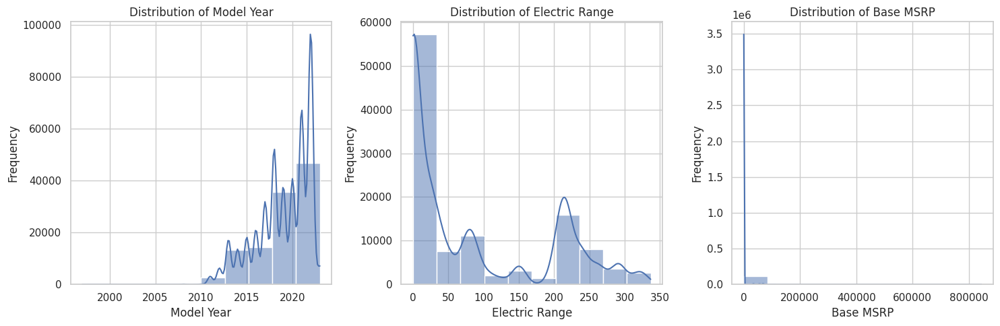

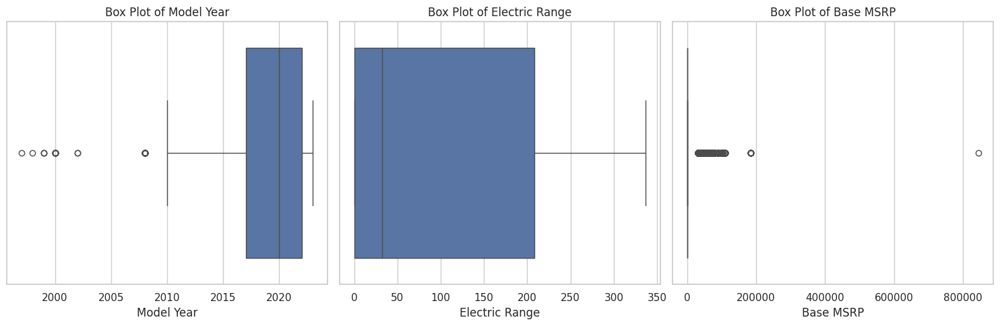

In [64]:
# Display descriptive statistics
print(data[['Model Year', 'Electric Range', 'Base MSRP']].describe())

# Histograms
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.histplot(df['Model Year'], bins=10, kde=True)
plt.title('Distribution of Model Year')
plt.xlabel('Model Year')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
sns.histplot(df['Electric Range'], bins=10, kde=True)
plt.title('Distribution of Electric Range')
plt.xlabel('Electric Range')
plt.ylabel('Frequency')

plt.subplot(1, 3, 3)
sns.histplot(df['Base MSRP'], bins=10, kde=True)
plt.title('Distribution of Base MSRP')
plt.xlabel('Base MSRP')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Box Plots
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.boxplot(x=df['Model Year'])
plt.title('Box Plot of Model Year')

plt.subplot(1, 3, 2)
sns.boxplot(x=df['Electric Range'])
plt.title('Box Plot of Electric Range')

plt.subplot(1, 3, 3)
sns.boxplot(x=df['Base MSRP'])
plt.title('Box Plot of Base MSRP')

plt.tight_layout()
plt.show()


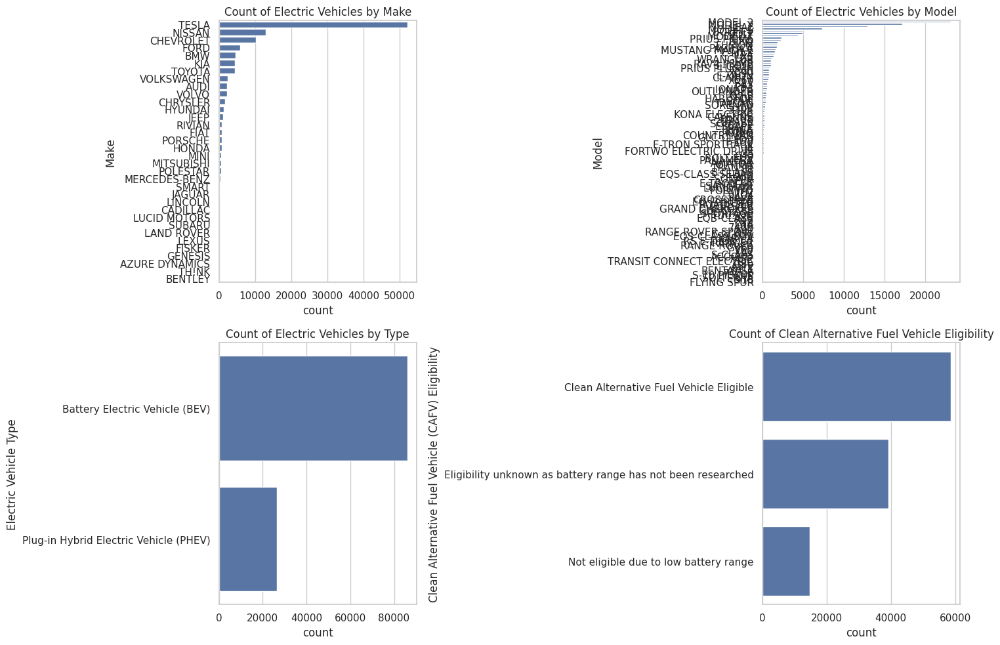

In [65]:
df = pd.DataFrame(data)

# Set the figure size for the plots
plt.figure(figsize=(15, 10))

# Count plot for 'Make'
plt.subplot(2, 2, 1)
sns.countplot(y='Make', data=df, order=df['Make'].value_counts().index)
plt.title('Count of Electric Vehicles by Make')

# Count plot for 'Model'
plt.subplot(2, 2, 2)
sns.countplot(y='Model', data=df, order=df['Model'].value_counts().index)
plt.title('Count of Electric Vehicles by Model')

# Count plot for 'Electric Vehicle Type'
plt.subplot(2, 2, 3)
sns.countplot(y='Electric Vehicle Type', data=df, order=df['Electric Vehicle Type'].value_counts().index)
plt.title('Count of Electric Vehicles by Type')

# Count plot for 'Clean Alternative Fuel Vehicle (CAFV) Eligibility'
plt.subplot(2, 2, 4)
sns.countplot(y='Clean Alternative Fuel Vehicle (CAFV) Eligibility', data=df, order=df['Clean Alternative Fuel Vehicle (CAFV) Eligibility'].value_counts().index)
plt.title('Count of Clean Alternative Fuel Vehicle Eligibility')

# Adjust layout and display plots
plt.tight_layout()
plt.show()


#**BIVARIATE ANALYSIS**

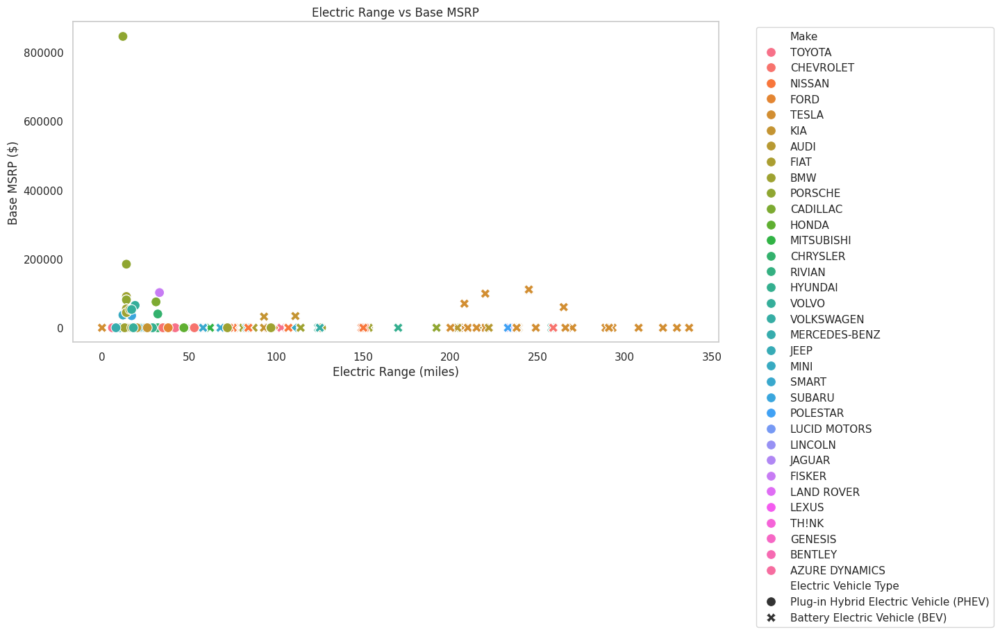

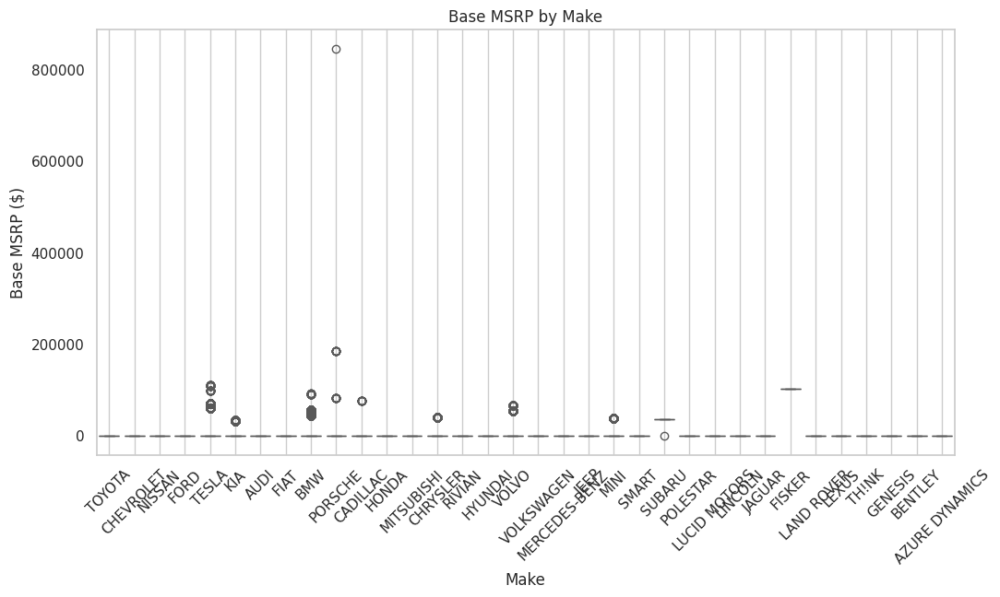

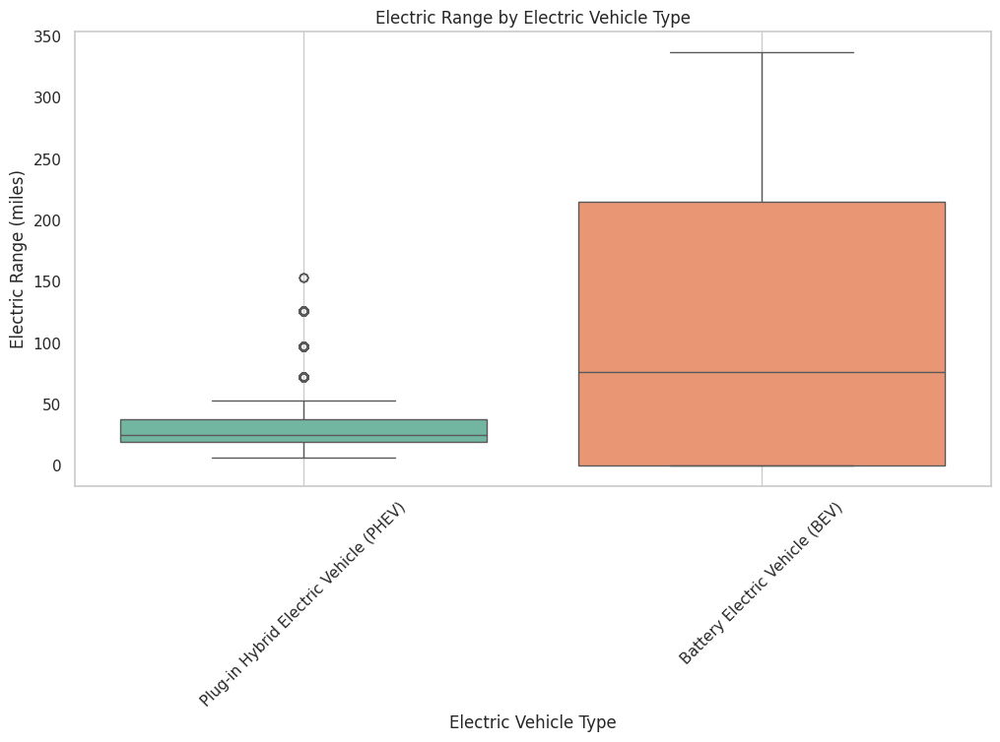

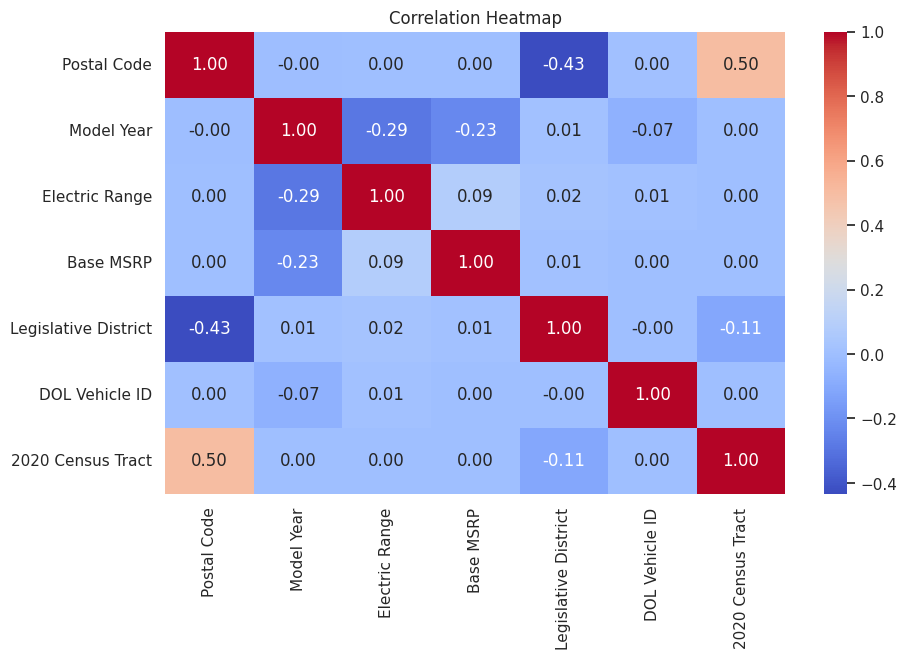

In [66]:
# Set the aesthetics for the plots
sns.set(style="whitegrid")

# 1. Scatter Plot: Electric Range vs Base MSRP
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x='Electric Range', y='Base MSRP', hue='Make', style='Electric Vehicle Type', s=100)
plt.title('Electric Range vs Base MSRP')
plt.xlabel('Electric Range (miles)')
plt.ylabel('Base MSRP ($)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid()
plt.show()

# 2. Box Plot: Base MSRP by Make
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='Make', y='Base MSRP', palette='Set2')
plt.title('Base MSRP by Make')
plt.xlabel('Make')
plt.ylabel('Base MSRP ($)')
plt.xticks(rotation=45)
plt.grid()
plt.show()

# 3. Box Plot: Electric Range by Electric Vehicle Type
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='Electric Vehicle Type', y='Electric Range', palette='Set2')
plt.title('Electric Range by Electric Vehicle Type')
plt.xlabel('Electric Vehicle Type')
plt.ylabel('Electric Range (miles)')
plt.xticks(rotation=45)
plt.grid()
plt.show()

# 4. Correlation Heatmap
# Select only numeric columns for correlation
numeric_df = df.select_dtypes(include='number')

plt.figure(figsize=(10, 6))
correlation_matrix = numeric_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

#**TASK-2**

**1.SCATTER PLOTING**

In [67]:
#Scatter plot on EV vs MSRP
fig = px.scatter(data,
                 x='Electric Range',              # X-axis: Electric Range
                 y='Base MSRP',                   # Y-axis: Base MSRP
                 color='Make',                    # Color points by Make
                 hover_name='Model',              # Hover information to display
                 title='Scatter Plot: Electric Range vs Base MSRP',  # Title of the plot
                 labels={'Electric Range': 'Electric Range (miles)',   # X-axis label
                         'Base MSRP': 'Base MSRP ($)'})  # Y-axis label

# Show the plot
fig.show()

**2.BOX PLOTTING**

In [68]:
#Box plotting on univariate and bivariate
fig_univariate = px.box(data,
                        y='Base MSRP',                   # Numeric column for the box plot
                        title='Univariate Box Plot: Base MSRP',  # Title of the plot
                        labels={'Base MSRP': 'Base MSRP ($)'}  # Y-axis label
                       )

# Show the univariate box plot
fig_univariate.show()

fig_bivariate = px.box(df,
                       x='Electric Vehicle Type',       # Categorical column
                       y='Electric Range',              # Numeric column
                       title='Bivariate Box Plot: Electric Range by Vehicle Type',  # Title of the plot
                       labels={'Electric Vehicle Type': 'Electric Vehicle Type',
                               'Electric Range': 'Electric Range (miles)'}  # Axis labels
                      )

# Show the bivariate box plot
fig_bivariate.show()

#**3.PIE CHART**

In [69]:

# Pie chart using plotly.express
fig = px.pie(data,  # Your dataframe
    names='Electric Vehicle Type',  # Categorical variable (e.g., 'Electric Vehicle Type')
    values='Base MSRP',  # Numerical variable (e.g., 'Base MSRP')
    title='Proportion of Electric Vehicle Types by Base MSRP',
    labels={'Electric Vehicle Type': 'Vehicle Type'}
)

# Show the pie chart
fig.show()












#**CHOROPLETH PLOT USING PLOTLY.EXPRESS**

In [76]:
#  Load your dataset
df = pd.read_csv('/content/Dataset.csv')  # Update this line with your dataset path

# Prepare the Data
# Count the number of EVs by State
ev_count = df['State'].value_counts().reset_index()
ev_count.columns = ['State', 'Number of EVs']

# Step 5: Create the Choropleth Plot
fig = px.choropleth(ev_count,
                    locations='State',              # Column containing location names
                    locationmode='USA-states',     # Use USA states
                    color='Number of EVs',          # Column containing values for color coding
                    scope='usa',                    # Limit map to USA
                    title='Number of Electric Vehicles by State',
                    color_continuous_scale=px.colors.sequential.Plasma)  # Choose a color scale

# Show the plot
fig.show()


#**ANIMATED CHOROPLETH PLOT USING PLOTLY.EXPRESS**

In [71]:
import plotly.express as px

# Assuming 'df' is your DataFrame with EV data

fig = px.choropleth(
    df,  # Your DataFrame
    locations="State",  # Column with state/region names
    color="Base MSRP",  # Column for color intensity (e.g., Base MSRP)
    hover_name="State",  # Column for hover text
    animation_frame="Model Year",  # Column for animation (e.g., year)
    locationmode="USA-states",  # Set location mode for US states
    scope="usa",  # Focus on USA map
    title="Electrical Vechile Base MSRP Animation by State",
    color_continuous_scale="Turbo",  # Choose a vibrant color scale
)

fig.update_layout(
    title_font_size=24,          # Adjust title font size
    geo_bgcolor='lightgrey',     # Set background color of the map
    font=dict(size=16, color='darkblue'),  # Set font properties for the entire plot
)

# Show the animated choropleth plot
fig.show()


#**TASK-3**

#**RACING BAR PLOT**

In [72]:
# step 1:Install the bar-chart-race module using pip.
!pip install bar-chart-race


In [73]:
# Step 2: Import the required library
import bar_chart_race as bcr


In [74]:
# Import necessary libraries
import pandas as pd
import bar_chart_race as bcr

# Load the dataset
# Assuming the dataset is saved as 'Dataset.csv'
df = pd.read_csv('/content/Dataset.csv')

# Prepare the data for bar chart racing
# Group the data by 'Model Year' and 'Make', then count the occurrences of each make for each year
final = df.groupby(['Model Year', 'Make']).size().unstack(fill_value=0)

# Call the bar_chart_race function to create the racing bar plot
bcr.bar_chart_race(
    # The DataFrame where each row represents a period of time (in this case, year-wise EV make counts)
    df=final,

    # Name of the output video file
    filename="final.mp4",

    # Orientation of the bars ('h' for horizontal)
    orientation="h",

    # Sort bars in descending order for each period
    sort="desc",

    # Number of bars to display in each frame
    n_bars=10,

    # Smoothness of the animation (higher values make the animation smoother)
    steps_per_period=45,

    # Duration of each period in milliseconds (3000ms = 3 seconds per frame)
    period_length=3000,

    # Title of the chart and its styling
    title='Year-wise EV Makes and their Counts',
)

# The animated bar chart will be saved as 'final.mp4'


In [75]:
# Import necessary libraries
import bar_chart_race as bcr
from IPython.display import Video

# Assuming 'final' is your prepared DataFrame with EV counts by make and year
# Create the Racing Bar Plot animation
bcr.bar_chart_race(
    df=final,  # 'final' should be your prepared DataFrame with EV counts by make and year
    filename="final.mp4",  # Name of the output video file
    figsize=(10,5 ),  # Figure size
    dpi=120,           # Dots per inch for better quality
    orientation="h",   # Horizontal bar chart
    sort="desc",       # Sort bars descending in each frame
    n_bars=10,         # Number of bars to display per frame
    steps_per_period=45,  # Number of animation steps per year
    period_length=3000,   # Period length in milliseconds (3 seconds for each year)
    bar_kwargs={'alpha': 0.99, 'lw': 0},  # Bar opacity and line width
    title='Year-wise Electric Vehicle Make Counts',  # Main title
    title_size=20,                     # Title font size
    period_label={'x': 0.95, 'y': 0.15,  # Position of the period label (year)
                  'ha': 'right', 'va': 'center'},  # Alignment of period label
    # Removed unsupported parameters like bar_texttemplate
)

# Display the video
Video("final.mp4", embed=True)
